In [1]:
%matplotlib inline

# 1) Wipe out your namespace
%reset -f

# 2) Clear Jupyter’s stored outputs (and inputs if you like)
try:
    Out.clear() 
except NameError:
    pass

try:
    In.clear()
except NameError:
    pass

# 3) Force Python GC
import gc
gc.collect()

# 4) Free any GPU buffers
import torch
if torch.cuda.is_available():
    torch.cuda.empty_cache()


import importlib
from libs import trades, plots, params, feats, strategies
importlib.reload(trades)
importlib.reload(plots)
importlib.reload(params)
importlib.reload(feats)
importlib.reload(strategies)

<module 'libs.strategies' from '/workspace/my_models/Trading/_Stock_Analysis_/libs/strategies.py'>

In [2]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
import seaborn as sns

import glob
import os
import json
import re
import os
import psutil

import time
import datetime as dt
from tqdm.auto import tqdm
from IPython.display import clear_output, display

In [3]:
# Read the unscaled indicators dataframe (only the test part)

df_inds_test = pd.read_csv(params.indunsc_test_csv, index_col=0, parse_dates=True)
# compute synthetic ask/bid from close_raw and configured spread
df_inds_test['ask'] = df_inds_test['close'] * (1 + params.bidask_spread_pct/100)
df_inds_test['bid'] = df_inds_test['close'] * (1 - params.bidask_spread_pct/100)

df_inds_test

,open,high,low,close,volume,signal,ret,log_ret,sma_9,sma_21,sma_pct_9,sma_pct_21,ema_9,ema_21,roc_9,roc_21,body,body_pct,upper_shad,lower_shad,range_pct,rsi_6,macd_line,macd_signal,macd_diff,atr_14,atr_pct_14,bb_lband_20,bb_hband_20,bb_w_20,plus_di,minus_di,adx,obv,vwap_14,vwap_dev_pct_14,vol_spike,vol_z_14,rolling_max_close_21,rolling_min_close_21,dist_high_21,dist_low_21,obv_sma,obv_diff_14,obv_pct_14,obv_sma_14,obv_z_14,ret_30,sma_30,sma_pct_30,ema_30,roc_30,rsi_30,atr_30,atr_pct_30,bb_lband_30,bb_hband_30,bb_w_30,plus_di_30,minus_di_30,adx_30,obv_diff_30,obv_pct_30,obv_sma_30,obv_z_30,vwap_30,vwap_dev_pct_30,z_vwap_dev_30,vol_spike_30,vol_z_30,ret_std_30,rolling_max_close_30,rolling_min_close_30,dist_high_30,dist_low_30,macd_line_30,macd_signal_30,macd_diff_30,ret_45,sma_45,sma_pct_45,ema_45,roc_45,rsi_45,atr_45,atr_pct_45,bb_lband_45,bb_hband_45,bb_w_45,plus_di_45,minus_di_45,adx_45,obv_diff_45,obv_pct_45,obv_sma_45,obv_z_45,vwap_45,vwap_dev_pct_45,z_vwap_dev_45,vol_spike_45,vol_z_45,ret_std_45,rolling_max_close_45,rolling_min_close_45,dist_high_45,dist_low_45,macd_line_45,macd_signal_45,macd_diff_45,ret_60,sma_60,sma_pct_60,ema_60,roc_60,rsi_60,atr_60,atr_pct_60,bb_lband_60,bb_hband_60,bb_w_60,plus_di_60,minus_di_60,adx_60,obv_diff_60,obv_pct_60,obv_sma_60,obv_z_60,vwap_60,vwap_dev_pct_60,z_vwap_dev_60,vol_spike_60,vol_z_60,ret_std_60,rolling_max_close_60,rolling_min_close_60,dist_high_60,dist_low_60,macd_line_60,macd_signal_60,macd_diff_60,volume_z_30,vol_spike_z_30,ret_std_z_30,obv_pct_z_30,vwap_dev_pct_z_30,bb_w_z_30,atr_z_30,macd_diff_z_30,volume_z_45,vol_spike_z_45,ret_std_z_45,obv_pct_z_45,vwap_dev_pct_z_45,bb_w_z_45,atr_z_45,macd_diff_z_45,volume_z_60,vol_spike_z_60,ret_std_z_60,obv_pct_z_60,vwap_dev_pct_z_60,bb_w_z_60,atr_z_60,macd_diff_z_60,minute_time,hour_time,dow_time,month_time,day_of_year_time,week_of_year_time,in_sess_time,eng_ma,eng_macd,eng_bb,eng_bb_mid,eng_rsi,eng_adx,eng_obv,eng_atr_div,z_eng_atr,eng_sma_short,eng_sma_long,eng_vwap,z_vwap_dev,z_bb_w,z_obv,mom_sum_30,mom_std_30,mom_sum_45,mom_std_45,mom_sum_60,mom_std_60,eng_ema_cross_up,eng_ema_cross_down,ask,bid
2022-12-23 10:58:00,132.506667,132.506667,132.506667,132.506667,3.766667e+02,0.068838,-0.000025,-0.000025,132.517407,132.463651,-0.000081,0.000325,132.501714,132.450580,0.000126,0.000428,0.000,0.000000,0.000,0.000,0.000000,55.324571,0.066914,0.076274,-0.009361,0.030896,0.000233,132.351547,132.577120,0.001703,53.329334,22.545811,52.004170,4.810433e+04,132.024282,0.365375,0.462019,-0.911671,132.540,132.36,0.000252,0.001107,4.767483e+04,4.656333e+03,35.146275,4.767483e+04,0.269138,0.002547,132.419889,0.000655,132.403860,0.002547,67.514546,0.034648,0.000261,132.220285,132.619493,0.003015,49.033670,19.075239,40.643327,1.196033e+04,90.321276,4.478294e+04,0.370286,132.417943,0.067003,-1.435313,0.424020,-0.936193,0.000271,132.540,132.20,0.000252,0.002314,0.084061,0.080324,0.003737,0.003663,132.310329,0.001484,132.330747,0.003663,67.477198,0.037214,0.000281,131.957731,132.662926,0.005330,45.383192,19.249055,28.521447,2.131996e+04,161.136009,4.104582e+04,0.244755,132.288077,0.165238,-0.378640,0.394909,-1.100015,0.000230,132.540,132.028750,0.000252,0.003607,0.072126,0.069040,0.003086,0.004638,132.228319,0.002105,132.270541,0.004638,66.814987,0.038612,0.000291,131.810366,132.646273,0.006322,43.207120,20.127475,0.000000,4.737383e+04,358.272975,3.439157e+04,0.345499,132.165188,0.258373,0.724499,0.327654,-1.358106,0.000201,132.540,131.922500,0.000252,0.004409,0.063599,0.059554,0.004045,-0.467325,-0.000002,0.190732,-0.326255,-0.796174,-0.714829,-2.471902,-20.000000,-0.677505,-0.000002,20.000000,-20.000000,-20.000000,20.000000,-1.096288,0.000000,-0.861826,-1.606155e-11,0.000000,0.000000,20.000000,20.000000,-0.187204,0.000000,0.352778,0.312500,0.071429,0.416667,0.475342,0.461538,0.0,0.000406,-0.000071,0.00000,-0.000319,0.000000,0.098520,0.099620,-0.242750,-1.828533,0.000081,-0.000325,-99.724259,-0.805629,0.201443,-0.950054,0.087051,0.000484,0.145175,0.000955,0

In [4]:
importlib.reload(params) #####
importlib.reload(strategies) #####

sim_results = {}
groups = df_inds_test.groupby(df_inds_test.index.normalize())
total_days = df_inds_test.index.normalize().nunique()

for day, df_day in tqdm(groups, desc="Generate+Simulate", total=total_days):
    df_actions = strategies.generate_tradact_ema921(
        df              = df_day,
        col_signal      = "ema_9",
        sign_thresh     = "ema_21",
        col_atr         = "atr_14",
        col_rsi         = "rsi_6",
        col_vwap        = "vwap_14",
        rsi_thresh      = params.rsi_thresh_tick,
        sellmin_idx     = params.sellmin_idx_tick,
        trailstop_pct   = params.trailstop_pct_tick,
        atr_mult        = params.atr_mult_tick,
        vwap_atr_mult   = params.vwap_atr_mult_tick,
        sess_start      = params.sess_start_tick
    )
    sim_results.update(
        strategies.simulate_trading(
            day         = day,
            df          = df_actions,
            sellmin_idx = params.sellmin_idx_tick,
            sess_start  = params.sess_start_tick
        )
    )

print("Loop finished. Days simulated:", len(sim_results))


Smoothing+Generate+Simulate:   0%|          | 0/622 [00:00<?, ?it/s]

Loop finished. Days simulated: 622


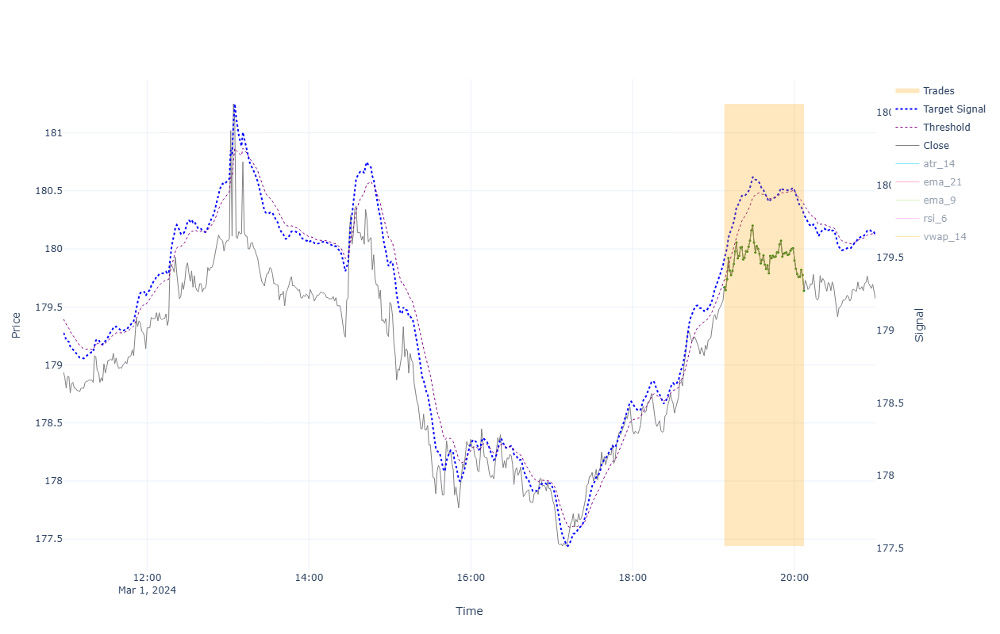


=== Performance for 2024-03-01 00:00:00 ===

BUY&HOLD:
  Bid(0) 179.534 - Ask(0) 179.826 - Fee(0) [0.004+0.029] = -0.325
TRADES:
  Bid(1) 179.604 - Ask(1) 179.706 - Fee(1) [0.004+0.029] = -0.135
STRATEGY:
  Trade(1) -0.135 = -0.135

------------------------------------------------------------------------------------------------------------------------



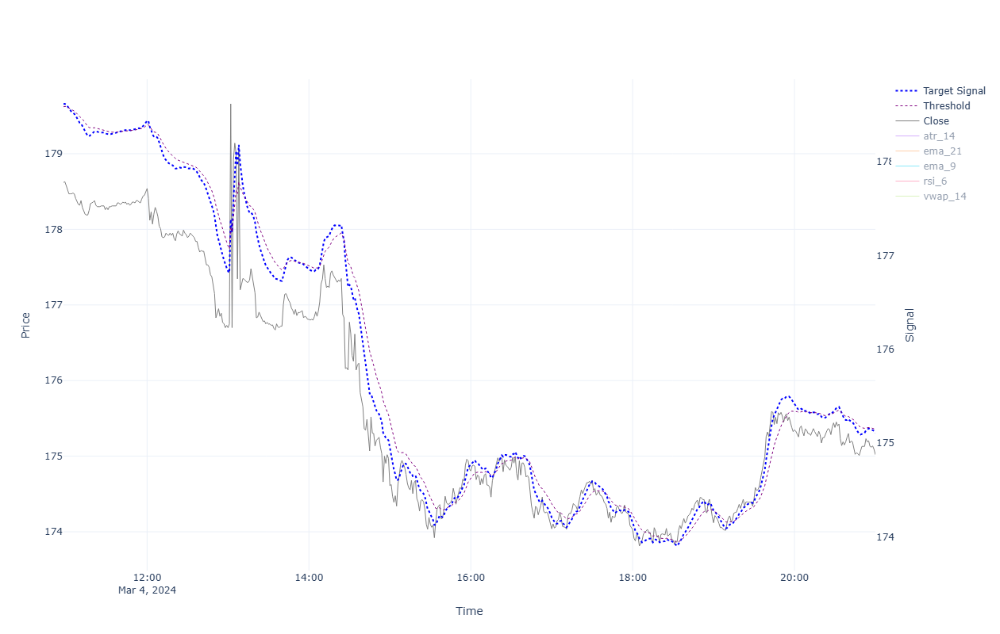


=== Performance for 2024-03-04 00:00:00 ===

BUY&HOLD:
  Bid(0) 174.985 - Ask(0) 176.78 - Fee(0) [0.004+0.028] = -1.828
TRADES:
STRATEGY:
  0.000

------------------------------------------------------------------------------------------------------------------------



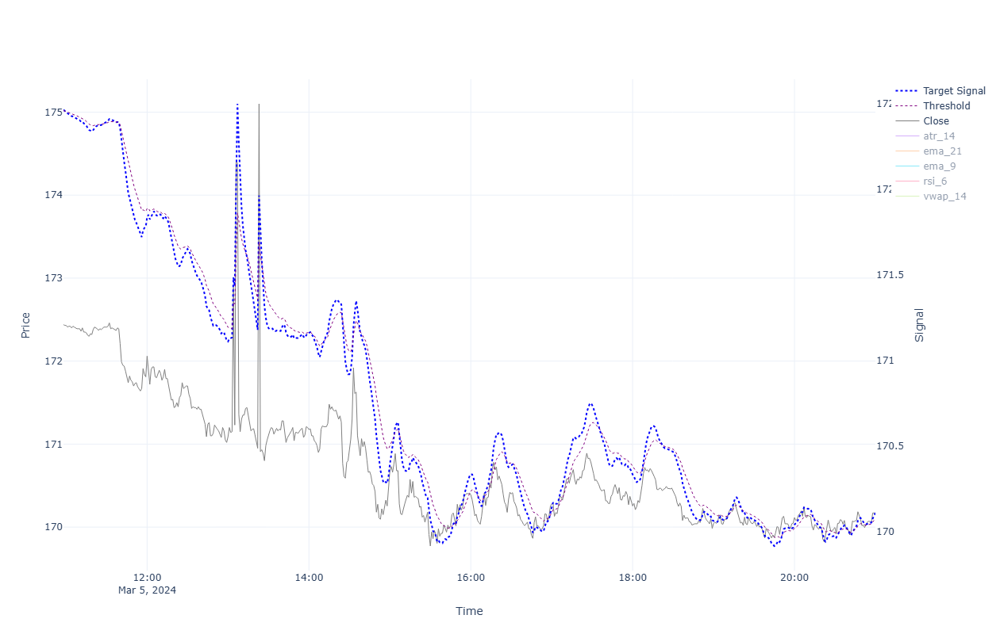


=== Performance for 2024-03-05 00:00:00 ===

BUY&HOLD:
  Bid(0) 170.136 - Ask(0) 171.144 - Fee(0) [0.004+0.028] = -1.04
TRADES:
STRATEGY:
  0.000

------------------------------------------------------------------------------------------------------------------------



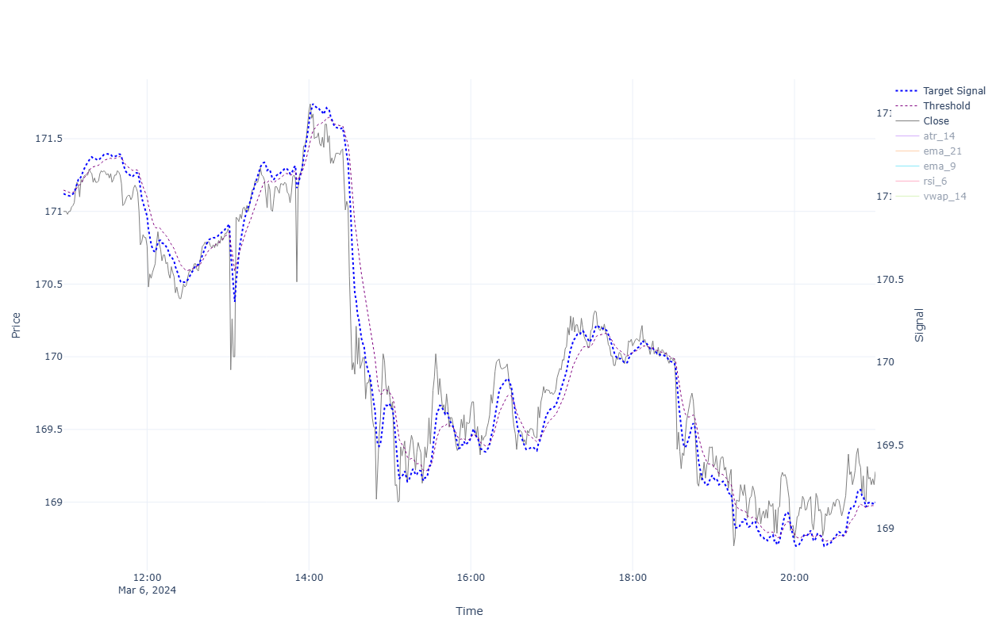


=== Performance for 2024-03-06 00:00:00 ===

BUY&HOLD:
  Bid(0) 169.176 - Ask(0) 171.224 - Fee(0) [0.004+0.028] = -2.08
TRADES:
STRATEGY:
  0.000

------------------------------------------------------------------------------------------------------------------------



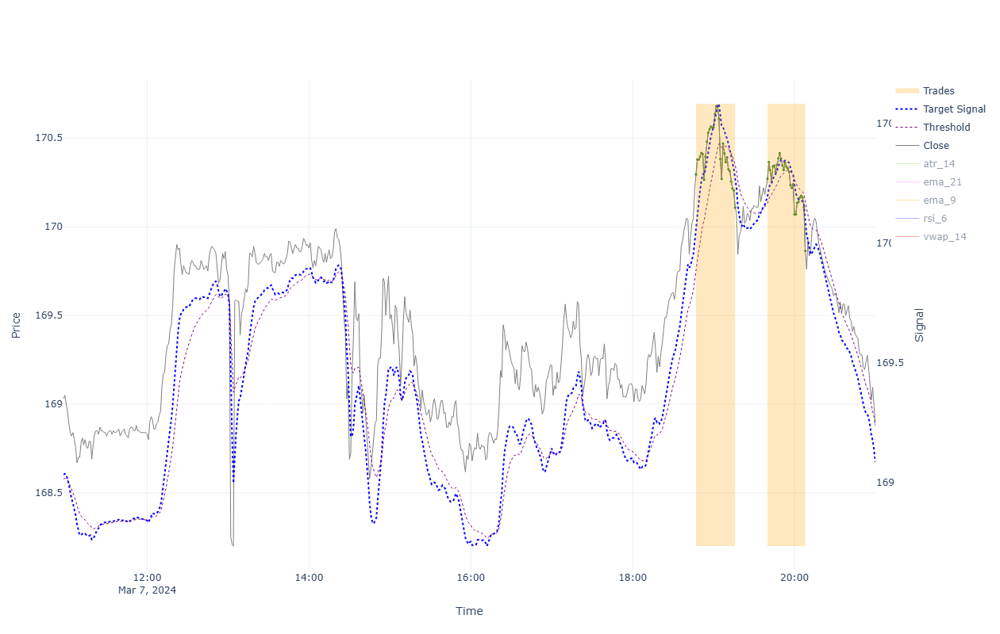


=== Performance for 2024-03-07 00:00:00 ===

BUY&HOLD:
  Bid(0) 168.846 - Ask(0) 169.844 - Fee(0) [0.004+0.027] = -1.029
TRADES:
  Bid(1) 170.074 - Ask(1) 170.329 - Fee(1) [0.004+0.028] = -0.287
  Bid(2) 169.83 - Ask(2) 170.304 - Fee(2) [0.004+0.028] = -0.506
STRATEGY:
  Trade(1) -0.287 + Trade(2) -0.506 = -0.793

------------------------------------------------------------------------------------------------------------------------



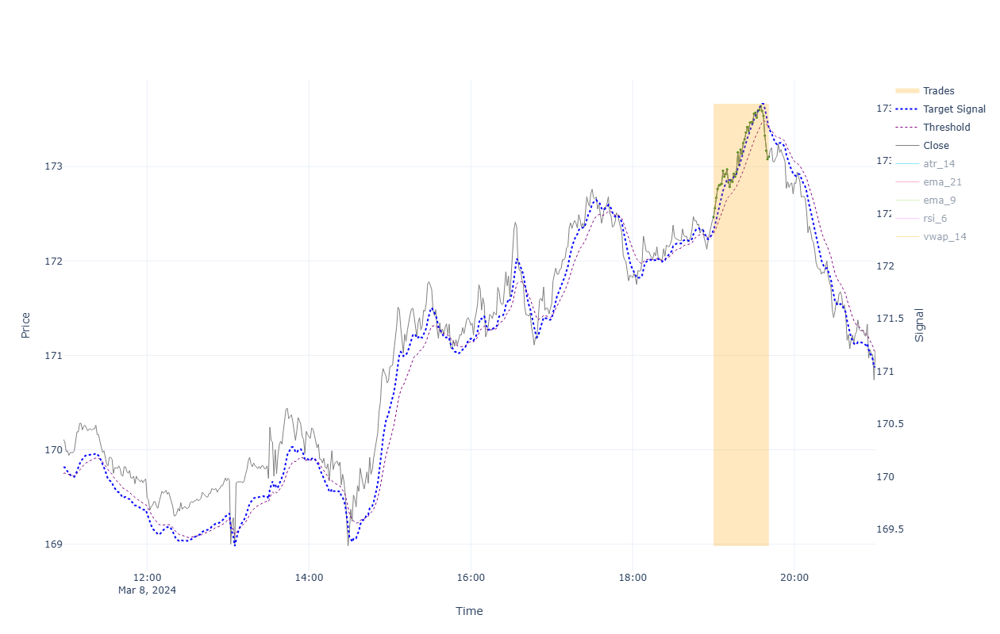


=== Performance for 2024-03-08 00:00:00 ===

BUY&HOLD:
  Bid(0) 171.021 - Ask(0) 169.729 - Fee(0) [0.004+0.028] = 1.26
TRADES:
  Bid(1) 173.07 - Ask(1) 172.499 - Fee(1) [0.004+0.028] = 0.539
STRATEGY:
  Trade(1) 0.539 = 0.539

------------------------------------------------------------------------------------------------------------------------



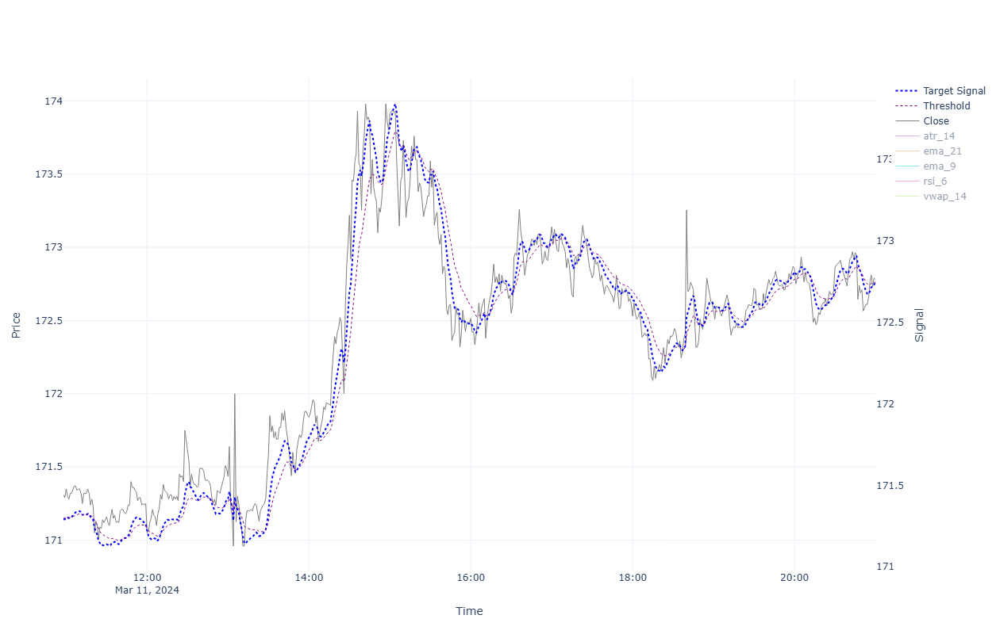


=== Performance for 2024-03-11 00:00:00 ===

BUY&HOLD:
  Bid(0) 172.745 - Ask(0) 171.624 - Fee(0) [0.004+0.028] = 1.089
TRADES:
STRATEGY:
  0.000

------------------------------------------------------------------------------------------------------------------------



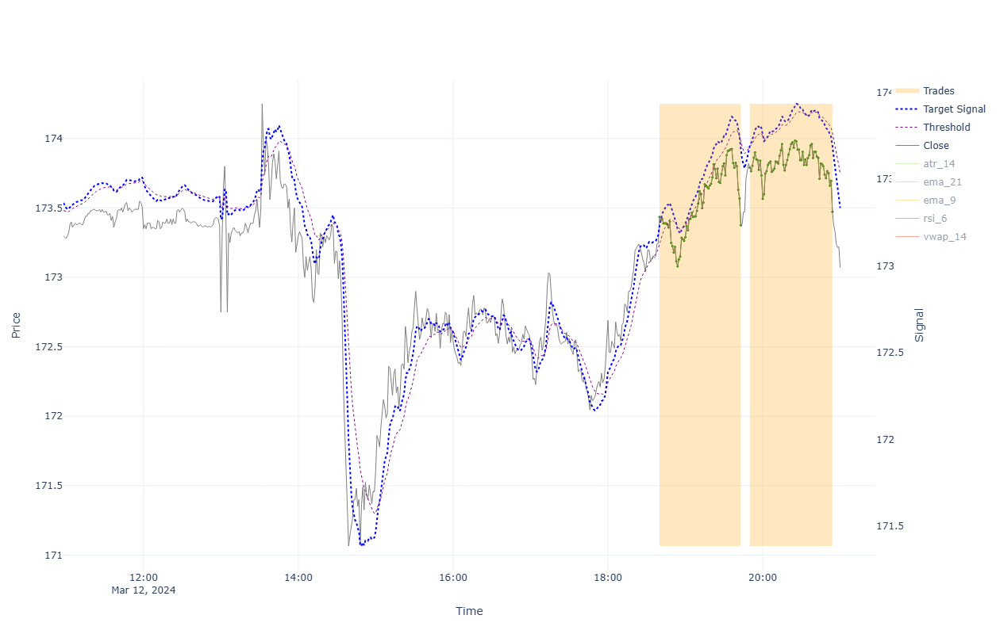


=== Performance for 2024-03-12 00:00:00 ===

BUY&HOLD:
  Bid(0) 173.035 - Ask(0) 173.395 - Fee(0) [0.004+0.028] = -0.391
TRADES:
  Bid(1) 173.34 - Ask(1) 173.47 - Fee(1) [0.004+0.028] = -0.161
  Bid(2) 173.438 - Ask(2) 173.825 - Fee(2) [0.004+0.028] = -0.419
STRATEGY:
  Trade(1) -0.161 + Trade(2) -0.419 = -0.58

------------------------------------------------------------------------------------------------------------------------



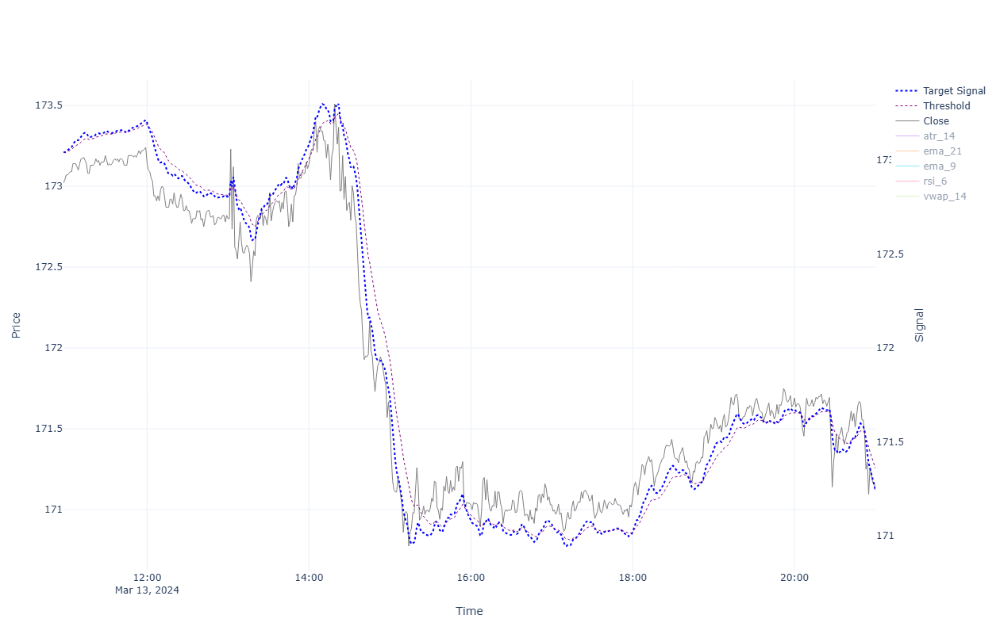


=== Performance for 2024-03-13 00:00:00 ===

BUY&HOLD:
  Bid(0) 171.086 - Ask(0) 172.865 - Fee(0) [0.004+0.028] = -1.811
TRADES:
STRATEGY:
  0.000

------------------------------------------------------------------------------------------------------------------------



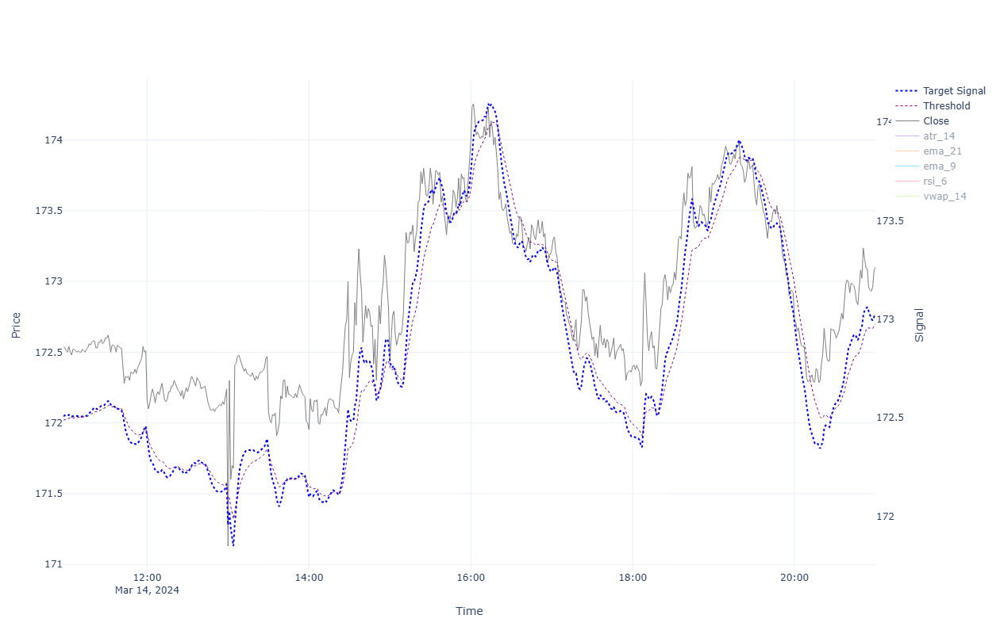


=== Performance for 2024-03-14 00:00:00 ===

BUY&HOLD:
  Bid(0) 173.065 - Ask(0) 172.114 - Fee(0) [0.004+0.028] = 0.919
TRADES:
STRATEGY:
  0.000

------------------------------------------------------------------------------------------------------------------------



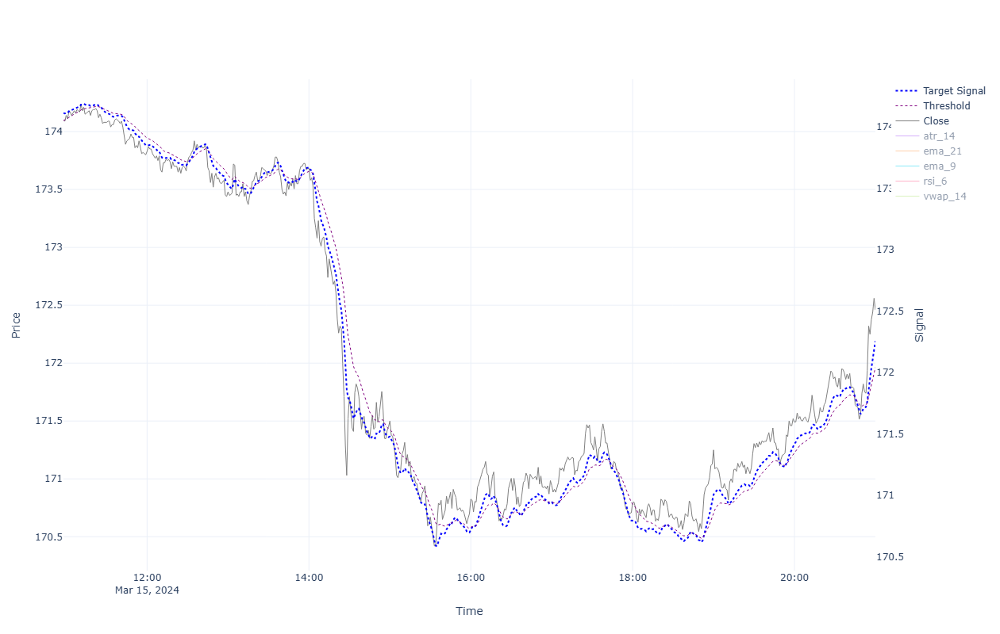


=== Performance for 2024-03-15 00:00:00 ===

BUY&HOLD:
  Bid(0) 172.426 - Ask(0) 173.685 - Fee(0) [0.004+0.028] = -1.291
TRADES:
STRATEGY:
  0.000

------------------------------------------------------------------------------------------------------------------------



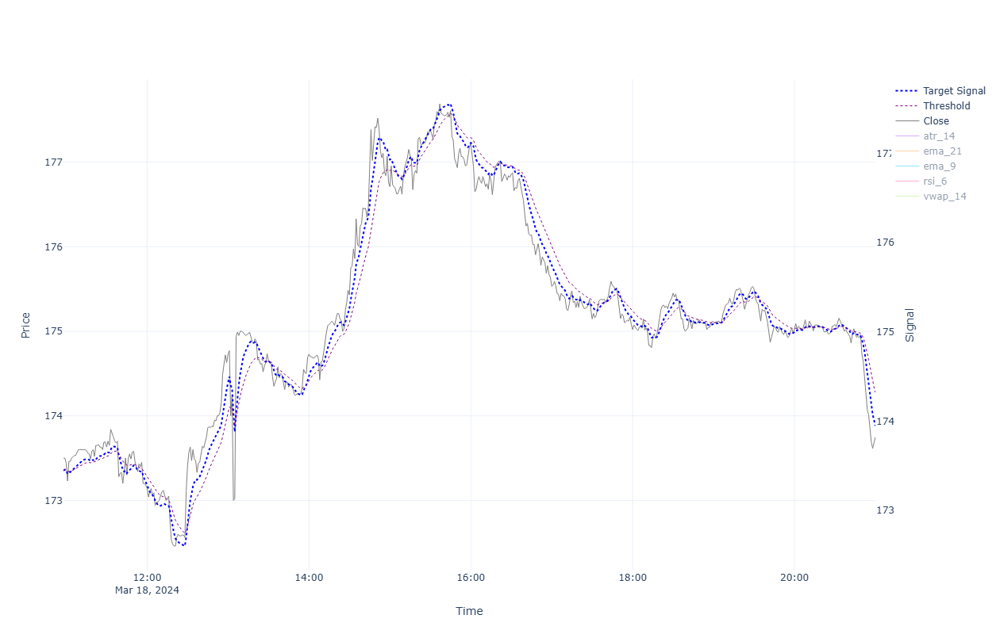


=== Performance for 2024-03-18 00:00:00 ===

BUY&HOLD:
  Bid(0) 173.715 - Ask(0) 174.685 - Fee(0) [0.004+0.028] = -1.002
TRADES:
STRATEGY:
  0.000

------------------------------------------------------------------------------------------------------------------------



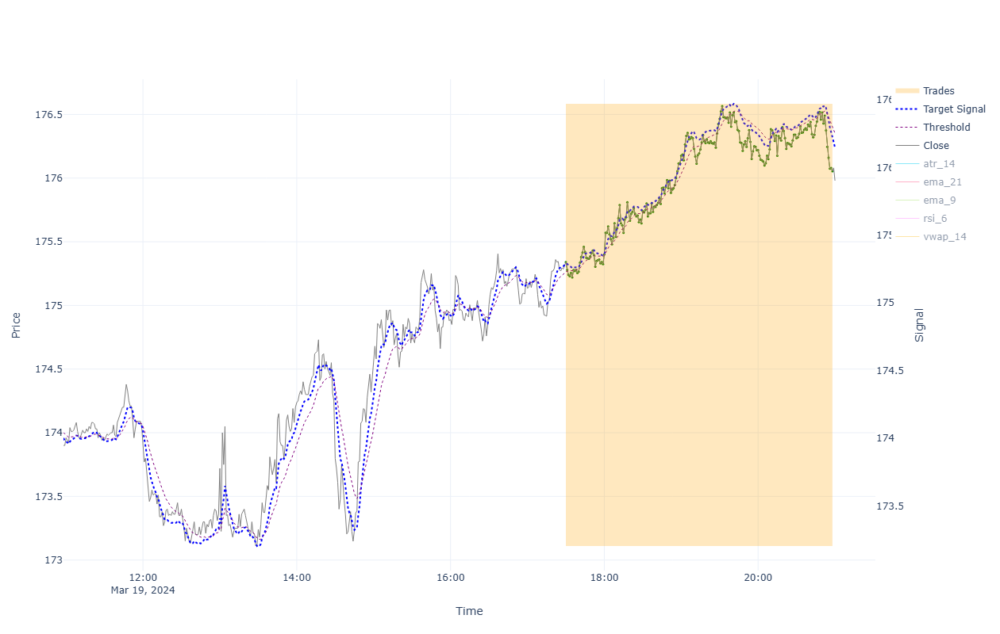


=== Performance for 2024-03-19 00:00:00 ===

BUY&HOLD:
  Bid(0) 175.945 - Ask(0) 173.275 - Fee(0) [0.004+0.028] = 2.638
TRADES:
  Bid(1) 176.02 - Ask(1) 175.375 - Fee(1) [0.004+0.028] = 0.612
STRATEGY:
  Trade(1) 0.612 = 0.612

------------------------------------------------------------------------------------------------------------------------



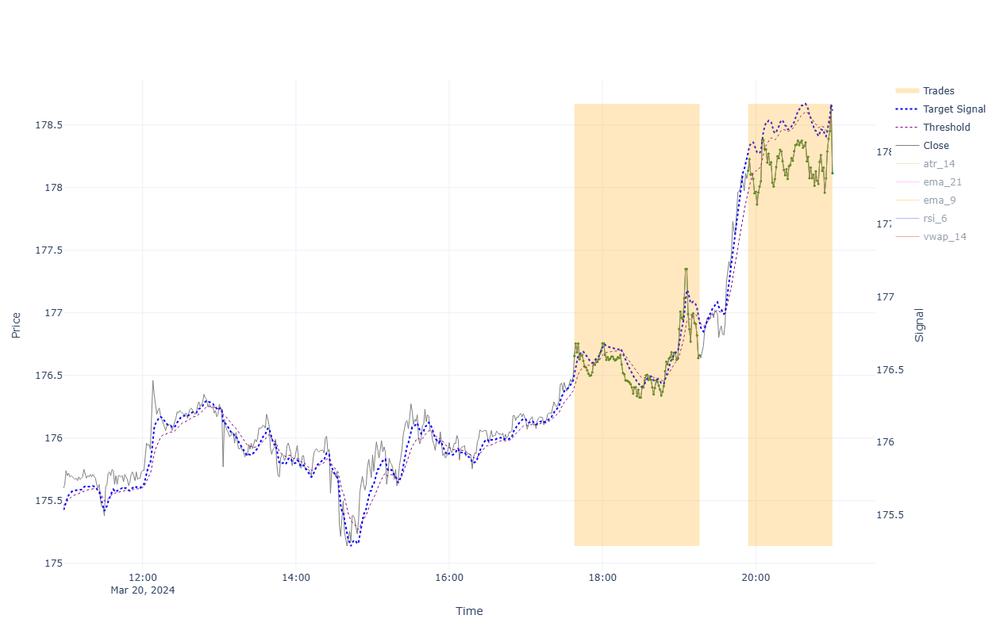


=== Performance for 2024-03-20 00:00:00 ===

BUY&HOLD:
  Bid(0) 178.079 - Ask(0) 176.035 - Fee(0) [0.004+0.029] = 2.011
TRADES:
  Bid(1) 176.625 - Ask(1) 176.69 - Fee(1) [0.004+0.029] = -0.098
  Bid(2) 178.079 - Ask(2) 178.17 - Fee(2) [0.004+0.0] = -0.094
STRATEGY:
  Trade(1) -0.098 + Trade(2) -0.094 = -0.192

------------------------------------------------------------------------------------------------------------------------



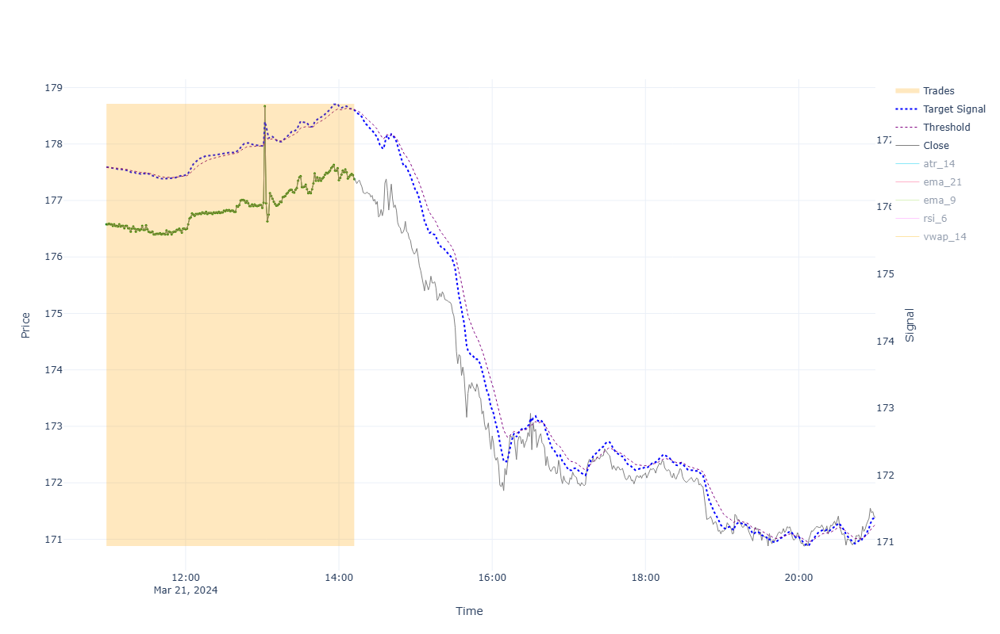


=== Performance for 2024-03-21 00:00:00 ===

BUY&HOLD:
  Bid(0) 171.356 - Ask(0) 177.465 - Fee(0) [0.004+0.028] = -6.142
TRADES:
  Bid(1) 177.345 - Ask(1) 178.079 - Fee(1) [0.0+0.029] = -0.764
STRATEGY:
  Trade(1) -0.764 = -0.764

------------------------------------------------------------------------------------------------------------------------



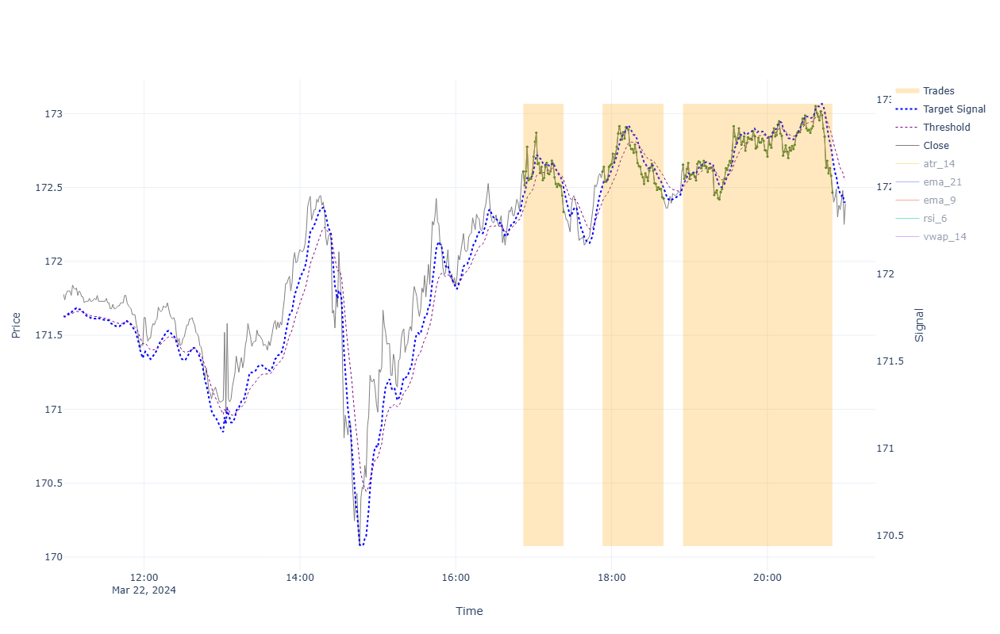


=== Performance for 2024-03-22 00:00:00 ===

BUY&HOLD:
  Bid(0) 172.356 - Ask(0) 171.514 - Fee(0) [0.004+0.028] = 0.809
TRADES:
  Bid(1) 172.301 - Ask(1) 172.642 - Fee(1) [0.004+0.028] = -0.373
  Bid(2) 172.391 - Ask(2) 172.642 - Fee(2) [0.004+0.028] = -0.283
  Bid(3) 172.431 - Ask(3) 172.69 - Fee(3) [0.004+0.028] = -0.291
STRATEGY:
  Trade(1) -0.373 + Trade(2) -0.283 + Trade(3) -0.291 = -0.947

------------------------------------------------------------------------------------------------------------------------



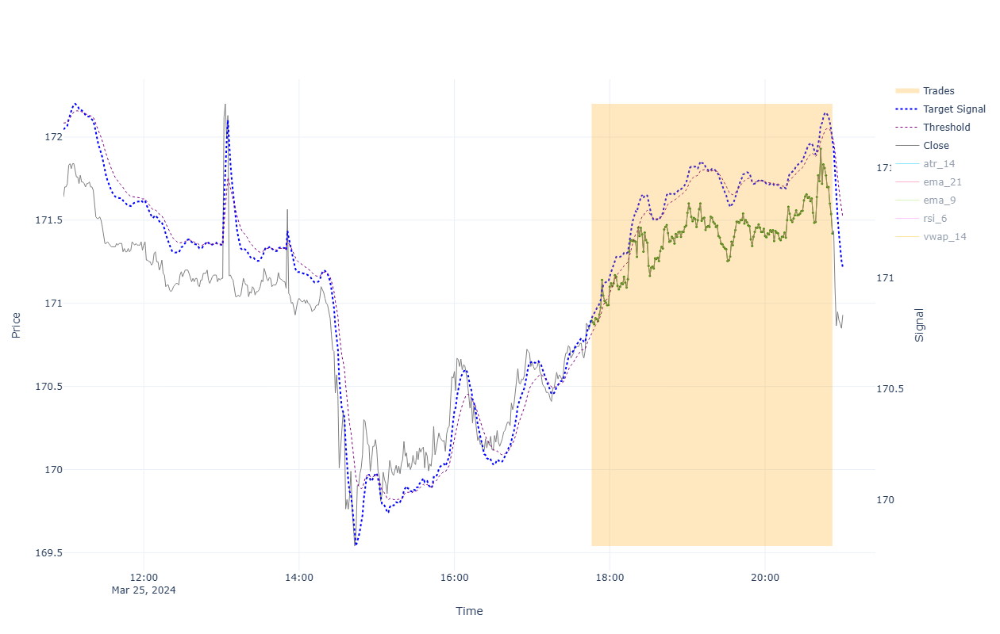


=== Performance for 2024-03-25 00:00:00 ===

BUY&HOLD:
  Bid(0) 170.896 - Ask(0) 171.134 - Fee(0) [0.004+0.028] = -0.27
TRADES:
  Bid(1) 171.386 - Ask(1) 170.929 - Fee(1) [0.004+0.028] = 0.425
STRATEGY:
  Trade(1) 0.425 = 0.425

------------------------------------------------------------------------------------------------------------------------



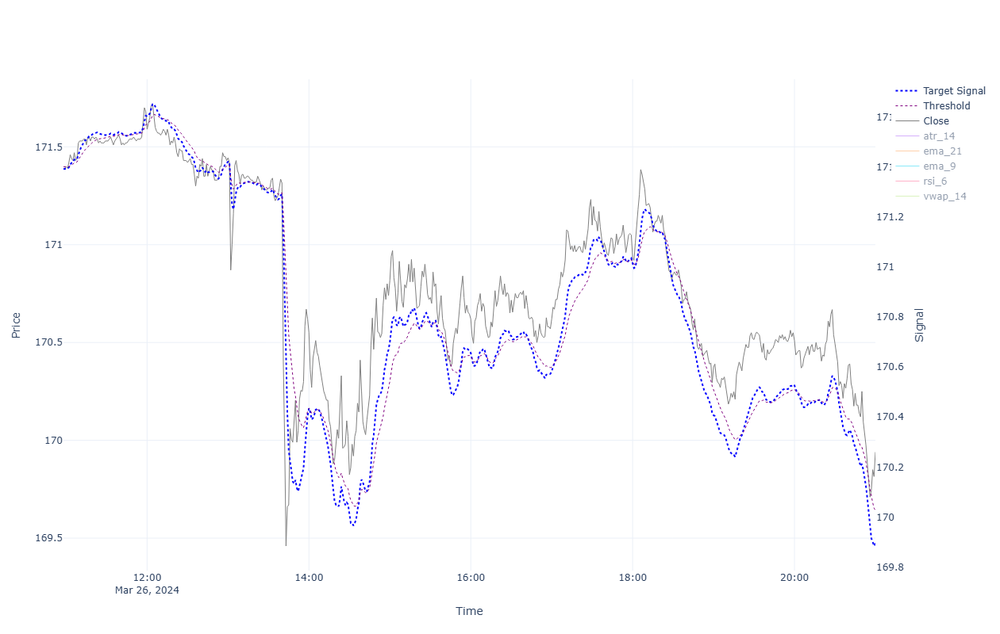


=== Performance for 2024-03-26 00:00:00 ===

BUY&HOLD:
  Bid(0) 169.906 - Ask(0) 171.324 - Fee(0) [0.004+0.028] = -1.45
TRADES:
STRATEGY:
  0.000

------------------------------------------------------------------------------------------------------------------------



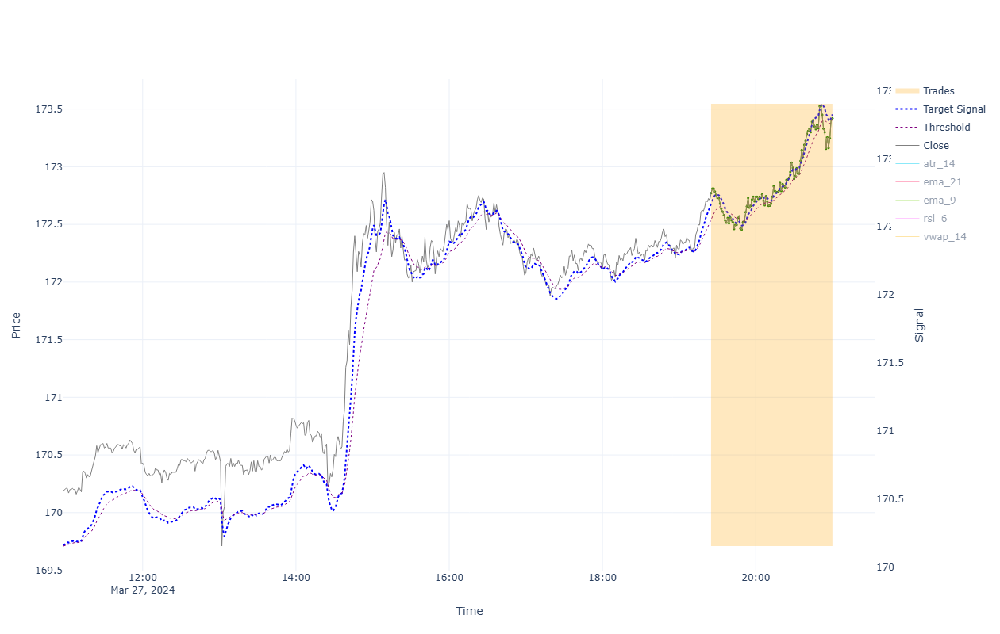


=== Performance for 2024-03-27 00:00:00 ===

BUY&HOLD:
  Bid(0) 173.385 - Ask(0) 170.484 - Fee(0) [0.004+0.028] = 2.869
TRADES:
  Bid(1) 173.385 - Ask(1) 172.805 - Fee(1) [0.004+0.0] = 0.577
STRATEGY:
  Trade(1) 0.577 = 0.577

------------------------------------------------------------------------------------------------------------------------



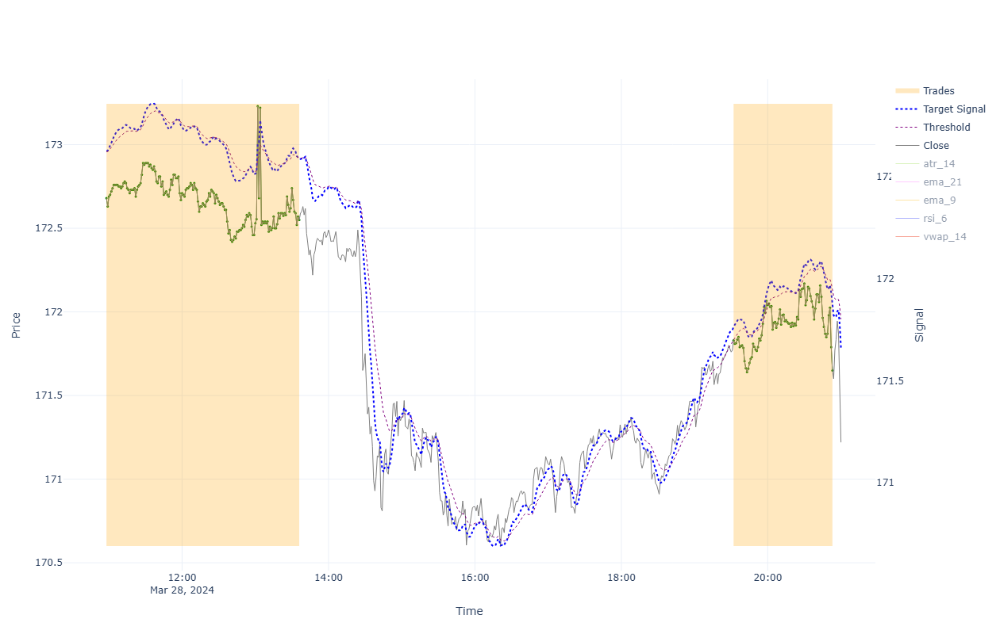


=== Performance for 2024-03-28 00:00:00 ===

BUY&HOLD:
  Bid(0) 171.186 - Ask(0) 172.775 - Fee(0) [0.004+0.028] = -1.621
TRADES:
  Bid(1) 172.515 - Ask(1) 173.385 - Fee(1) [0.0+0.028] = -0.898
  Bid(2) 171.616 - Ask(2) 171.864 - Fee(2) [0.004+0.028] = -0.28
STRATEGY:
  Trade(1) -0.898 + Trade(2) -0.28 = -1.178

------------------------------------------------------------------------------------------------------------------------


Overall Summary (2024-03-01 = 178.976 → 2024-03-28 = 171.186)
Num. trading days: 20
Trades Count: 17

One-Time B&H gain: -7.790
Sum Strategy gain: -2.436
Sum Intraday B&H gain: -8.685

One-Time B&H gain per day: -0.3895
Strategy gain per day: -0.1218
Strategy gain per trade: -0.1433


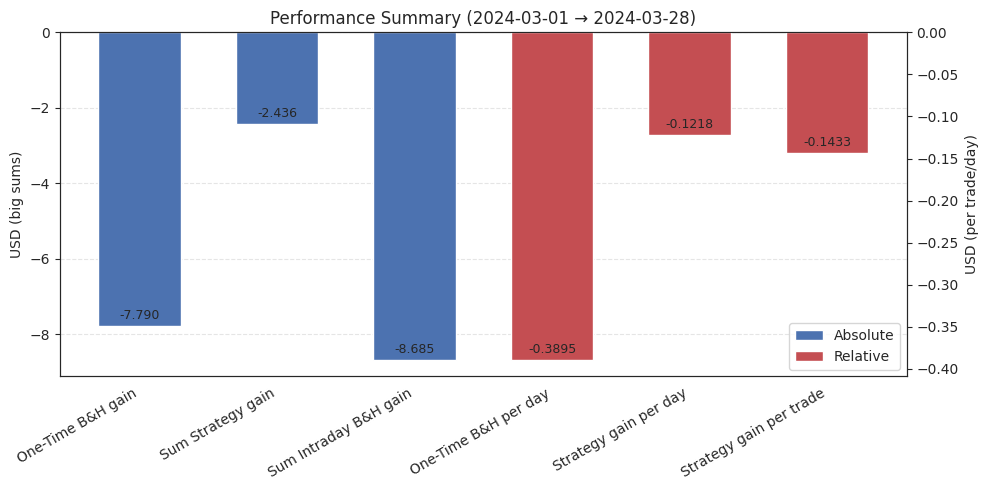


Overall Summary (2022-12-23 = 132.533 → 2025-06-18 = 196.501)
Num. trading days: 622
Trades Count: 539

One-Time B&H gain: 63.968
Sum Strategy gain: -113.501
Sum Intraday B&H gain: 63.254

One-Time B&H gain per day: 0.1028
Strategy gain per day: -0.1825
Strategy gain per trade: -0.2106


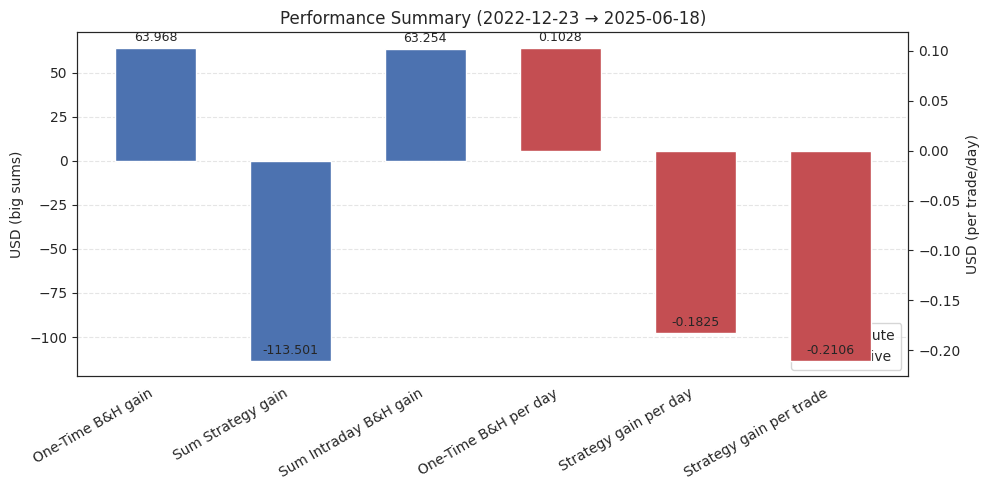

In [5]:
importlib.reload(params) ######
importlib.reload(plots) ######

df_month = df_inds_test[df_inds_test.index.to_period("M") == params.month_to_check]
year, month = map(int, params.month_to_check.split("-"))
days_in_month = [d for d in sim_results if d.year == year and d.month == month]
feats_inds = ['ema_9','ema_21','rsi_6', 'atr_14', 'vwap_14']

if not days_in_month:
    print(f"No simulation data for {params.month_to_check}")
else:
    for day in sorted(days_in_month):
        df_day, trades_day, stats_day = sim_results[day]
        plots.plot_trades(
            df = df_day,
            col_signal1 = "ema_9",
            sign_thresh = "ema_21", 
            trades = trades_day,
            performance_stats = stats_day,
            features = feats_inds,
            autoscale = False,
            extra_hover_fields = ['vwap_14', 'rsi_6', 'atr_14']
        )
        
        print(f"\n=== Performance for {day} ===\n")
        for k, v in stats_day.items():
            lines = v if isinstance(v, list) else str(v).splitlines()
            print(f"{k}:")
            for L in lines:
                print("  " + L)
        print("\n" + "-" * 120 + "\n")

# monthly / overall aggregates
plots.aggregate_performance([sim_results[d][2] for d in sorted(days_in_month)], df_month)
plots.aggregate_performance([sim_results[d][2] for d in sorted(sim_results)], df_inds_test)
